In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip "/content/drive/MyDrive/Colab Notebooks/ENNCA/archive.zip" -d .

Archive:  /content/drive/MyDrive/Colab Notebooks/ENNCA/archive.zip
replace ./DIV2K_train_HR/DIV2K_train_HR/0001.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

Task:

Build the dataset object, you should load both input image in LR and target image in HR. Prepare some visualization of the samples having some agumentation simulating blurring, noise and compress effects(You can do that from HR with some compression, downsampling)


In [83]:
from os import listdir, path, cpu_count
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision import models
from matplotlib import pyplot as plt

torch.manual_seed(42)

In [130]:
def resize(x, k):
  h = x.size(2) * k
  w = x.size(3) * k
  return T.functional.resize(x, (h, w))

In [ ]:
from PIL import Image

def rgb_to_ycbcr_pil(img):
    ycbcr_img = img.convert("YCbCr")
    return ycbcr_img

In [64]:
class SRDataset(Dataset):
  def __init__(self, root, downsampling=3):
    self.samples = list(map(lambda filename: path.join(root, filename), listdir(root)))
    self.transforms = T.Compose([
        T.ColorJitter(),
        T.RandomApply([T.GaussianBlur(7)]),
        T.Normalize(0, 1)
    ])
    self.downsampling = downsampling

  def __getitem__(self, index):
    path = self.samples[index]
    img = Image.open(path)
    img = rgb_to_ycbcr_pil(img)
    x = T.functional.to_tensor(img)
    x = T.functional.resize(x, (1440//3, 1920//3))
    x = self.transforms(x)
    y = x[0:1]
    cbcr = x[1:]
    return y, cbcr

  def __len__(self):
    return len(self.samples)

In [65]:
dataset = SRDataset('/content/DIV2K_train_HR/DIV2K_train_HR')
dataloader = DataLoader(dataset, 1, shuffle=True, num_workers=cpu_count())

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

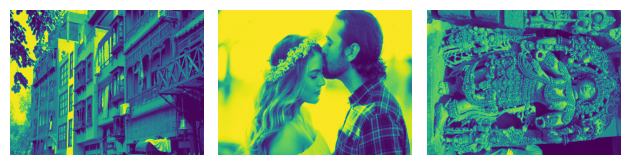

In [66]:
fig, axes = plt.subplots(1, 3, sharex=True, sharey=True)
data_iter = iter(dataloader)
for (i, ax) in enumerate(axes):
  x, _ = next(data_iter)
  img = T.functional.to_pil_image(x.squeeze())
  ax.imshow(img)
  ax.axis('off')
fig.tight_layout()

Task:
Build Resnet encoder and bifpn decoder network using all branches at different resolutions. Use pixel shuffle for final output from decoder to get SR output matching the SR requirements, 3 times in this case. You should generate Y channel only inputs for this task, you should expect also Y channel outputs for your target. Make forward of the data, and upsample the Cb,Cr components 3 times, can convert the output back to RGB format once you got the output from the network.

In [67]:
class BiFPN(nn.Module):
    def __init__(self, fpn_sizes):
        super(BiFPN, self).__init__()

        (
            P3_channels,
            P4_channels,
            P5_channels,
            P6_channels,
            P7_channels,
        ) = fpn_sizes
        self.W_bifpn = 64

        # self.p6_td_conv  = nn.Conv2d(P6_channels, self.W_bifpn, kernel_size=3, stride=1, groups=self.W_bifpn, bias=True, padding=1)
        self.p6_td_conv = nn.Conv2d(
            P6_channels,
            self.W_bifpn,
            kernel_size=3,
            padding=1,
        )
        self.p6_td_conv_2 = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p6_td_act = nn.GELU() # RELU
        self.p6_td_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p6_td_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p6_td_w2 = torch.nn.Parameter(torch.tensor(1.0))

        self.p5_td_conv = nn.Conv2d(
            P5_channels,
            self.W_bifpn,
            kernel_size=3,
            padding=1,
        )
        self.p5_td_conv_2 = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p5_td_act = nn.GELU() # RELU
        self.p5_td_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p5_td_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p5_td_w2 = torch.nn.Parameter(torch.tensor(1.0))

        self.p4_td_conv = nn.Conv2d(
            P4_channels,
            self.W_bifpn,
            kernel_size=3,
            padding=1,
        )
        self.p4_td_conv_2 = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p4_td_act = nn.GELU() # RELU
        self.p4_td_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p4_td_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p4_td_w2 = torch.nn.Parameter(torch.tensor(1.0))
        self.p5_upsample = nn.Upsample(scale_factor=2, mode='nearest')

        self.p3_out_conv = nn.Conv2d(
            P3_channels,
            self.W_bifpn,
            kernel_size=3,
            padding=1,
        )
        self.p3_out_conv_2 = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p3_out_act = nn.GELU() # RELU
        self.p3_out_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p3_out_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p3_out_w2 = torch.nn.Parameter(torch.tensor(1.0))
        self.p4_upsample = nn.Upsample(scale_factor=2, mode='nearest')

        # self.p4_out_conv = nn.Conv2d(P4_channels, self.W_bifpn, kernel_size=3, stride=1, bias=True, padding=1)
        self.p4_out_conv = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p4_out_act = nn.GELU() # RELU
        self.p4_out_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p4_out_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p4_out_w2 = torch.nn.Parameter(torch.tensor(1.0))
        self.p4_out_w3 = torch.nn.Parameter(torch.tensor(1.0))
        self.p5_upsample = nn.Upsample(scale_factor=2, mode='nearest')
        self.p3_downsample = nn.MaxPool2d(kernel_size=2)

        # self.p5_out_conv = nn.Conv2d(P5_channels,self.W_bifpn, kernel_size=3, stride=1, bias=True, padding=1)
        self.p5_out_conv = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p5_out_act = nn.GELU() # RELU
        self.p5_out_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p5_out_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p5_out_w2 = torch.nn.Parameter(torch.tensor(1.0))
        self.p5_out_w3 = torch.nn.Parameter(torch.tensor(1.0))
        self.p6_upsample = nn.Upsample(scale_factor=2, mode='nearest')
        self.p4_downsample = nn.MaxPool2d(kernel_size=2)

        # self.p6_out_conv = nn.Conv2d(P6_channels, self.W_bifpn, kernel_size=3, stride=1, bias=True, padding=1)
        self.p6_out_conv = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p6_out_act = nn.GELU() # RELU
        self.p6_out_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p6_out_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p6_out_w2 = torch.nn.Parameter(torch.tensor(1.0))
        self.p6_out_w3 = torch.nn.Parameter(torch.tensor(1.0))
        self.p7_upsample = nn.Upsample(scale_factor=2, mode='nearest')
        self.p5_downsample= nn.MaxPool2d(kernel_size=2)

        self.p7_out_conv = nn.Conv2d(
            P7_channels,
            self.W_bifpn,
            kernel_size=3,
            padding=1,
        )
        self.p7_out_conv_2 = nn.Conv2d(
            self.W_bifpn,
            self.W_bifpn,
            kernel_size=3,
            groups=self.W_bifpn,
            padding=1,
        )
        self.p7_out_act = nn.GELU() # RELU
        self.p7_out_conv_bn = nn.BatchNorm2d(self.W_bifpn)
        self.p7_out_w1 = torch.nn.Parameter(torch.tensor(1.0))
        self.p7_out_w2 = torch.nn.Parameter(torch.tensor(1.0))
        self.p6_downsample= nn.MaxPool2d(kernel_size=2)


    def forward(self, inputs):
        epsilon = 0.0001
        P3, P4, P5, P6, P7 = inputs
        # print ("Input::", P3.shape, P4.shape, P5.shape, P6.shape, P7.shape)
        # P6_td = self.p6_td_conv((self.p6_td_w1 * P6 ) /
        #                         (self.p6_td_w1 + epsilon))
        P7_td = self.p7_out_conv(P7)
        P6_td_inp = self.p6_td_conv(P6)
        a = self.p6_td_w1 * P6_td_inp
        b = self.p6_td_w2 * self.p7_upsample(P7_td)
        c = self.p6_td_w1 + self.p6_td_w2 + epsilon
        P6_td = self.p6_td_conv_2((a + b) / c)
        # P6_td = self.p6_td_conv_2(P6_td_inp)
        P6_td = self.p6_td_act(P6_td)
        P6_td = self.p6_td_conv_bn(P6_td)
        
        P5_td_inp = self.p5_td_conv(P5)
        a = self.p5_td_w1 * P5_td_inp
        b = self.p5_td_w2 * self.p5_upsample(P6_td)
        c = (self.p5_td_w1 + self.p5_td_w2 + epsilon)
        P5_td = self.p5_td_conv_2((a + b /c))
        P5_td = self.p5_td_act(P5_td)
        P5_td = self.p5_td_conv_bn(P5_td)

        # print (P4.shape, P5_td.shape)
        P4_td_inp = self.p4_td_conv(P4)
        P4_td = self.p4_td_conv_2(
            (
                self.p4_td_w1 * P4_td_inp
                + self.p4_td_w2 * self.p5_upsample(P5_td)
            )
            / (self.p4_td_w1 + self.p4_td_w2 + epsilon)
        )
        P4_td = self.p4_td_act(P4_td)
        P4_td = self.p4_td_conv_bn(P4_td)

        P3_td = self.p3_out_conv(P3)
        P3_out = self.p3_out_conv_2(
            (self.p3_out_w1 * P3_td + self.p3_out_w2 * self.p4_upsample(P4_td))
            / (self.p3_out_w1 + self.p3_out_w2 + epsilon)
        )
        P3_out = self.p3_out_act(P3_out)
        P3_out = self.p3_out_conv_bn(P3_out)

        # print (P4_td.shape, P3_out.shape)

        P4_out = self.p4_out_conv(
            (
                self.p4_out_w1 * P4_td_inp
                + self.p4_out_w2 * P4_td
                + self.p4_out_w3 * self.p3_downsample(P3_out)
            )
            / (self.p4_out_w1 + self.p4_out_w2 + self.p4_out_w3 + epsilon)
        )
        P4_out = self.p4_out_act(P4_out)
        P4_out = self.p4_out_conv_bn(P4_out)

        P5_out = self.p5_out_conv(
            (
                self.p5_out_w1 * P5_td_inp
                + self.p5_out_w2 * P5_td
                + self.p5_out_w3 * self.p4_downsample(P4_out)
            )
            / (self.p5_out_w2 + self.p5_out_w3 + epsilon)
        )
        P5_out = self.p5_out_act(P5_out)
        P5_out = self.p5_out_conv_bn(P5_out)

        P6_out = self.p6_out_conv((self.p6_out_w1 * P6_td_inp + 
                    self.p6_out_w2 * P6_td + 
                    self.p5_downsample(self.p6_out_w3 * (P5_out)) / 
                    (self.p6_out_w1 + self.p6_out_w2 + self.p6_out_w3 + epsilon)
        ))
        P6_out = self.p6_out_act(P6_out)
        P6_out = self.p6_out_conv_bn(P6_out)

        P7_out = self.p7_out_conv_2(
            (self.p7_out_w1 * P7_td + self.p7_out_w2 * self.p6_downsample(P6_out))
            / (self.p7_out_w1 + self.p7_out_w2 + epsilon)
        )
        P7_out = self.p7_out_act(P7_out)
        P7_out = self.p7_out_conv_bn(P7_out)

        return [P3_out, P4_out, P5_out, P6_out, P7_out]

In [68]:
class ResNet(nn.Module):
    def __init__(self):
        super(ResNet, self).__init__()
        resnet = models.resnet18()
        self.layer1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)
        self.layer2 = nn.Sequential(resnet.maxpool, resnet.layer1)
        self.layer3 = resnet.layer2
        self.layer4 = resnet.layer3
        self.layer5 = resnet.layer4
    def get_features(self, x):
        x1 = self.layer1(x)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        x5 = self.layer5(x4)
        return x1,x2,x3,x4,x5

In [135]:
class SRNet(nn.Module):
  def __init__(self):
    super().__init__()
    self.c1 = nn.Conv2d(1, 3, 1, bias=False)
    self.encoder = ResNet()
    self.decoder = BiFPN([64, 64, 128, 256, 512])
    self.downsample = nn.Conv2d(341, 144, 7, padding=3)

  def forward(self, x):
    x = self.c1(x)
    features = self.encoder.get_features(x)
    [p3, p4, p5, p6, p7]  = self.decoder(features)
    p3 = F.pixel_unshuffle(p3, 2)
    p5 = F.pixel_shuffle(p5, 2)
    p6 = F.pixel_shuffle(p6, 4)
    p7 = F.pixel_shuffle(p7, 8)
    x = torch.cat([p3,p4,p5,p6,p7], dim=1)
    x = self.downsample(x)
    x = F.pixel_shuffle(x, 12)
    return x

In [136]:
net = SRNet()

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

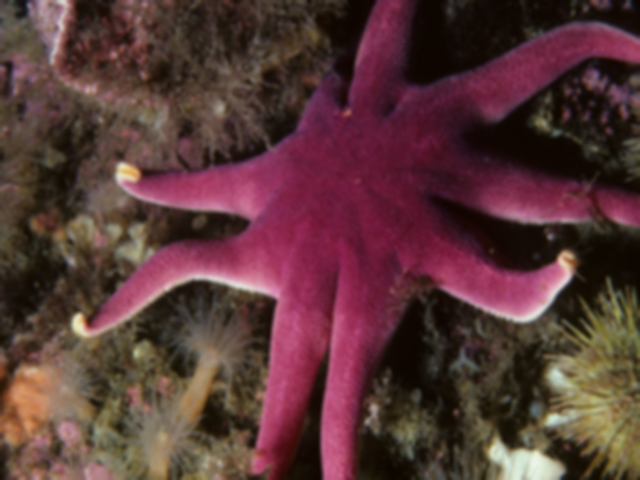

In [147]:
x, cbcr = next(iter(dataloader))
og = torch.cat([x, cbcr], dim=1).squeeze()
T.functional.to_pil_image(og, 'YCbCr').convert('RGB')

In [148]:
y = net(x)
reconstructed = torch.cat([y, resize(cbcr, 3)], dim=1).squeeze()

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


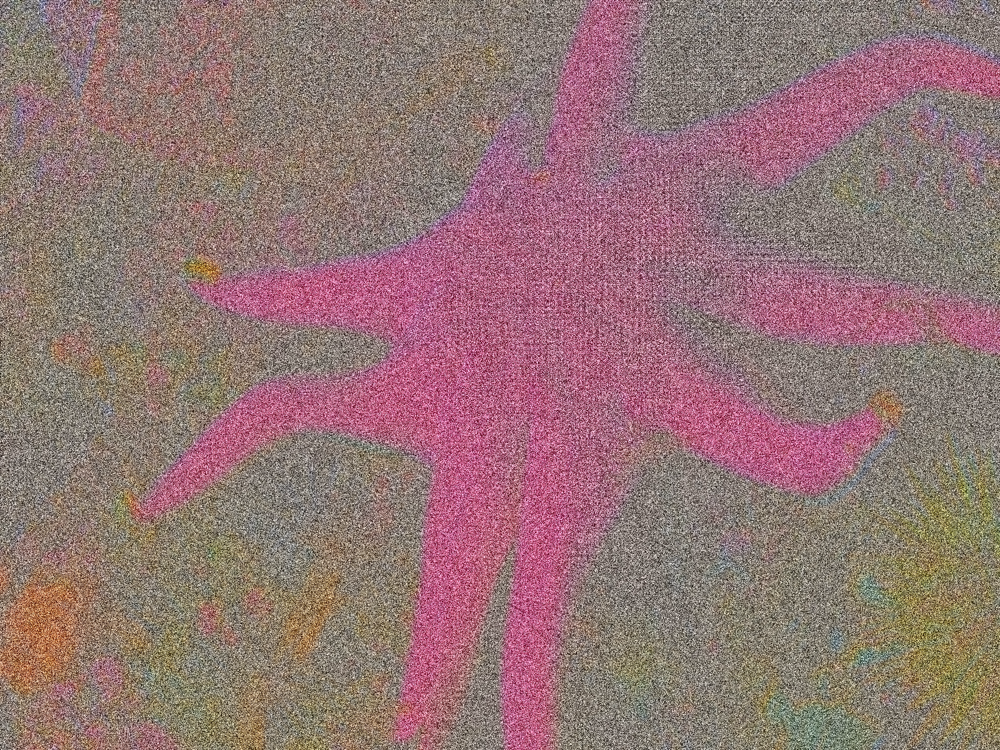

In [149]:
T.functional.to_pil_image(reconstructed, 'YCbCr').convert('RGB')

https://pytorch.org/docs/stable/generated/torch.nn.PixelShuffle.html

Task:
Collapsible linear blocks implementation
Having the reference implementation in Keras, try to implement CLB in torch.
Becareful of the conv2d parameters in keras mismatching in torch.

https://github.com/ARM-software/sesr/blob/master/models/model_utils.py
You should test it with

ps: You only need to implement `LinearBlock_c`. And you can skip anything related to `quant`.
``` 
a=LinearBlock_c(xxx)
data = torch.randn(3,1,224,224)
a.train()
a(data)
a.eval()
a(data)
a.collapsed_weights
```
to check how those linear layers are collapsed to a single conv layer.



In [344]:
class LinearBlock_c(nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size, num_inner_layers=2):
    super().__init__()
    self.conv1 = nn.Conv2d(in_channels, in_channels, 1)
    self.conv2 = nn.Conv2d(in_channels, in_channels, kernel_size, padding=kernel_size//2)
    self.conv3 = nn.Conv2d(in_channels, out_channels, 1)

    if num_inner_layers > 1:
      self.collapse = nn.Sequential(self.conv1, self.conv2, self.conv3)
    else:
      self.collapse = nn.Sequential(self.conv2, self.conv3)

    delta = torch.eye(in_channels).unsqueeze(2).unsqueeze(2)
    delta = F.pad(delta, (kernel_size//2,kernel_size//2,kernel_size//2,kernel_size//2))
    self.delta = nn.Parameter(delta, requires_grad=False)

    kernel_dim = [out_channels, in_channels, kernel_size, kernel_size]
    residual = torch.zeros(kernel_dim, dtype=torch.float32)

    if in_channels == out_channels:
          mid_k = int(kernel_size // 2)
          for out_ch in range(out_channels):
              residual[mid_k, mid_k, out_ch, out_ch] = 1.0

    self.residual = nn.Parameter(residual, requires_grad=False)
    self.collapsed_weights = None

  def forward(self, x):
    if self.training or self.collapsed_weights is None:
      wt_tensor = self.collapse(self.delta)
      wt_tensor = wt_tensor.flip(2)
      wt_tensor = wt_tensor.flip(3)
      wt_tensor = wt_tensor.permute((1, 0, 2, 3))
      wt_tensor += self.residual
      if not self.training:
        # store collapsed weights in the first inferece, won't need to collapse again
        self.collapsed_weights = nn.Parameter(wt_tensor, requires_grad=False)
        # remove references to uncollapsed variables
        self.collapse = None
    else:
      wt_tensor = self.collapsed_weights  
    x = F.conv2d(x, wt_tensor)
    return x

In [361]:
a = LinearBlock_c(1, 3, 5)
data = torch.randn(3,1,224,224)
a.train()
a(data)
a.eval()
a(data)
a.collapsed_weights

(Parameter containing:
 tensor([[[[ 0.1245,  0.0044, -0.0212,  0.0580,  0.0233],
           [ 0.0176, -0.0146,  0.0130,  0.0189,  0.0108],
           [ 0.0047,  0.1072, -0.0394,  0.0901,  0.0941],
           [ 0.0986,  0.0527,  0.1294,  0.0352,  0.0659],
           [-0.0350,  0.1303,  0.0254,  0.0466,  0.0340]]],
 
 
         [[[-0.4719, -0.5736, -0.5953, -0.5282, -0.5576],
           [-0.5625, -0.5897, -0.5663, -0.5614, -0.5682],
           [-0.5734, -0.4865, -0.6107, -0.5010, -0.4976],
           [-0.4938, -0.5327, -0.4676, -0.5475, -0.5215],
           [-0.6070, -0.4669, -0.5559, -0.5379, -0.5485]]],
 
 
         [[[ 0.2467,  0.3395,  0.3594,  0.2981,  0.3249],
           [ 0.3294,  0.3542,  0.3329,  0.3284,  0.3346],
           [ 0.3393,  0.2601,  0.3734,  0.2733,  0.2702],
           [ 0.2667,  0.3022,  0.2429,  0.3157,  0.2920],
           [ 0.3701,  0.2422,  0.3234,  0.3070,  0.3167]]]]),
 Parameter containing:
 tensor([[[[-0.9741, -0.8890, -0.9007, -0.8461, -0.7413],
          